In [2]:
#importing important libraries for the project

!pip install stop_words
!pip install wordcloud
!pip install palettable

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import missingno as msno
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
import string
import nltk
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
import re
from collections import Counter
from nltk.tokenize import RegexpTokenizer
from stop_words import get_stop_words
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score
from PIL import Image
import pickle

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

ModuleNotFoundError: No module named 'textblob'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df=pd.read_csv('/content/drive/My Drive/nlp/data/Scrapped_content.csv',error_bad_lines=False)

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0,4,5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
columns=['TITLE','PUBLISHER','Content','Author','Category']
df=df[columns]

In [ ]:
df=df.dropna(axis=0)
df=df.reset_index()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6243 entries, 0 to 6242
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   index      6243 non-null   int64 
 1   TITLE      6243 non-null   object
 2   PUBLISHER  6243 non-null   object
 3   Content    6243 non-null   object
 4   Author     6243 non-null   object
 5   Category   6243 non-null   object
dtypes: int64(1), object(5)
memory usage: 292.8+ KB


In [ ]:
df=df.drop(['index'],axis=1)

In [ ]:
df.head()

,TITLE,PUBLISHER,Content,Author,Category
0,Fed's Charles Plosser sees high bar for change...,Livemint,Paris/London/Atlanta: Federal Reserve Bank of ...,['Mark Deen'],Business
1,ECB FOCUS-Stronger euro drowns out ECB's messa...,Reuters,"FRANKFURT, March 10 (Reuters) - The European C...",['Reuters Editorial'],Business
2,Forex Market: EUR/USD retreats from 2-1/2-year...,Binary Tribune,The euro retreated from highs unseen since Oct...,['Vladimir Manev'],Business
3,ECB's Noyer: Low inflation may hamper adjustment,MarketWatch,PARIS--The slow pace of price increases and no...,['Gabriele Parussini'],Business
4,ECB Unlocks Door for Further Euro Strength - W...,DailyFX,Fundamental Forecast for Euro: Neutral\n\n- Fo...,['Christopher Vecchio'],Business


### Stemming and Lemmatization of Title and Content column <a id="chapter-1"></a>
> Stemming is the process of reducing inflected (or sometimes derived) words to their word stem, base or root form—generally a written word form. The stem need not be identical to the morphological root of the word. And, Lemmatization in linguistics is the process of grouping together the inflected forms of a word so they can be analyzed as a single item, identified by the word's lemma, or dictionary form


In [ ]:
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()
ps = PorterStemmer()


def lemmatize_text(text):
    return [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]

df['Title_lemmatized'] = df.TITLE.apply(lemmatize_text)
df['Content_lemmatized'] = df.Content.apply(lemmatize_text)

lemmatization_title=df['Title_lemmatized']
lemmatization_content=df['Content_lemmatized']

def title_stemming(text):
    l = []
    for i in text:
        for j in i:
            #converts list item to lower case
            p=j.lower()
            # removes punctuation,numbers and returns list of words
            q=re.sub('[^A-Za-z]+', ' ', p)
            l.append(ps.stem(q))
    return l

### Count Vs Publications<a id="chapter-2"></a>

Text(0.5, 1.0, 'Counts Vs PUBLISHER')

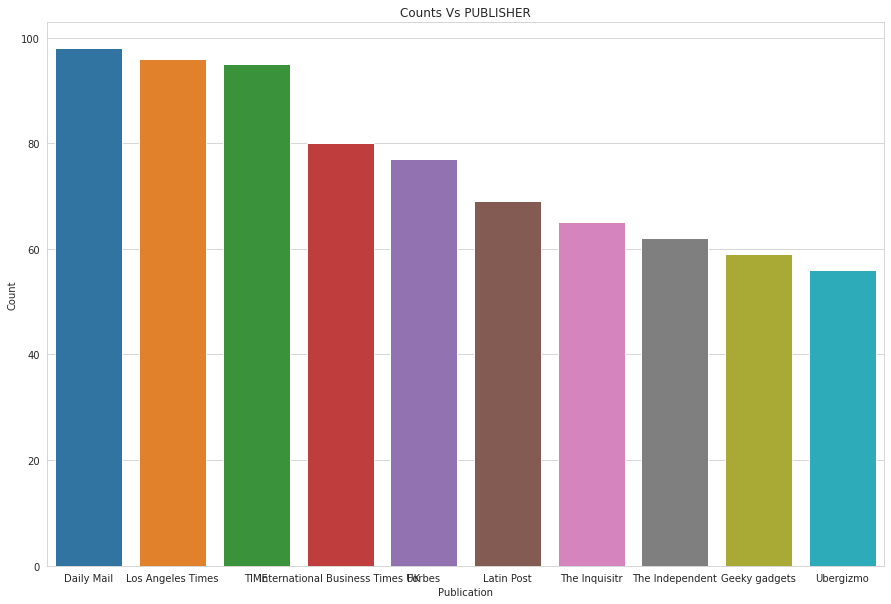

In [ ]:
z=df.groupby(by=['PUBLISHER'],as_index=False).count().sort_values(by='TITLE',ascending=False).head(10)

plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.barplot(x=z['PUBLISHER'],y=z['TITLE'], data=z)
plt.xlabel("Publication")
plt.ylabel("Count")
plt.title("Counts Vs PUBLISHER")

The above barplot shows the top 10 publications in the news dataset. The Daily Mail is having highest no. of publications

### Count Vs No. of Authors¶<a id="chapter-3"></a>

Text(0.5, 1.0, 'Counts Vs Author')

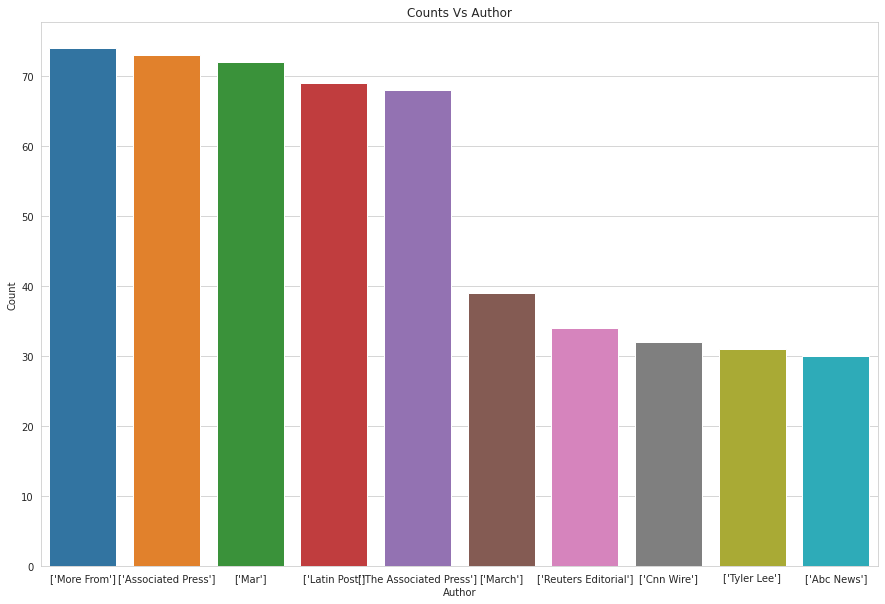

In [ ]:
z=df.groupby(by=['Author'],as_index=False).count().sort_values(by='PUBLISHER',ascending=False).head(10)

plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.barplot(x=z['Author'],y=z['PUBLISHER'], data=z)
plt.xlabel("Author")
plt.ylabel("Count")
plt.title("Counts Vs Author")

The above barplot shows the number of publications posted by an author.

### Count Vs Category¶<a id="chapter-4"></a>

Text(0.5, 1.0, 'Counts Vs Category')

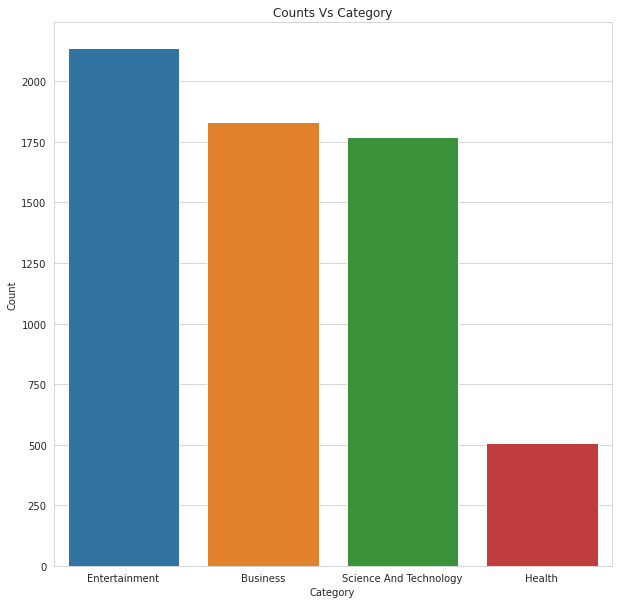

In [ ]:
z=df.groupby(by=['Category'],as_index=False).count().sort_values(by='TITLE',ascending=False).head(10)

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x=z['Category'],y=z['TITLE'], data=z)
plt.xlabel("Category")
plt.ylabel("Count")
plt.title("Counts Vs Category")

The above barplot shows that this dataset has more news in Entertainment category.

### Count the frequency of each word and display the words which are occuring most in Title column.<a id="chapter-5"></a>

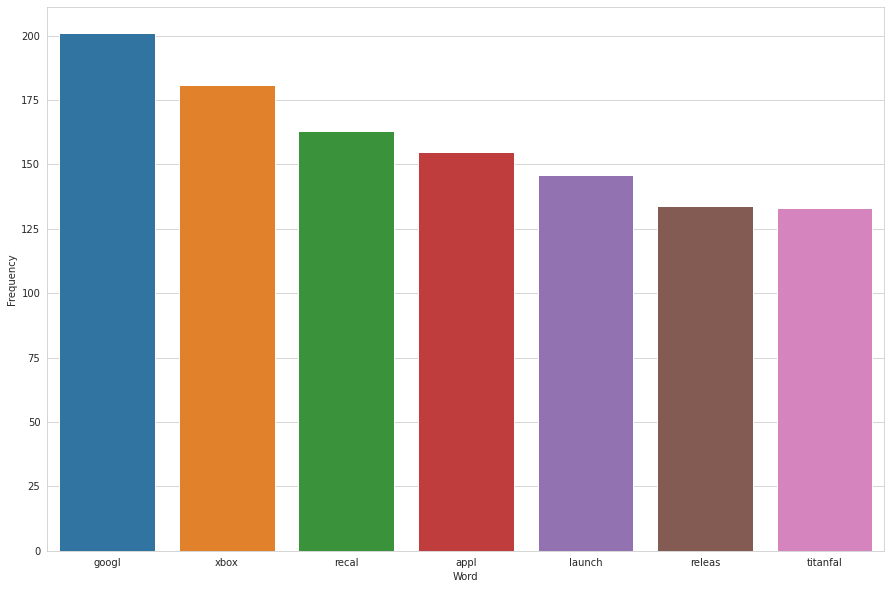

In [ ]:
top_N = 100

a=title_stemming(lemmatization_title)

#remove all the stopwords from the text
stop_words = list(get_stop_words('en'))         
nltk_words = list(stopwords.words('english'))   
stop_words.extend(nltk_words)

words_to_remove=['thi','also','it ','us ','one',' ','. ','said','say','new','like','get','make','last','use','said ','new ','get ','say ','xbox ']
filtered_sentence = []
for w in a:
    if w not in (stop_words):
        if w not in (words_to_remove):
            filtered_sentence.append(w)

# Remove characters which have length less than 2  
without_single_chr = [word for word in filtered_sentence if len(word) > 2]

# Remove numbers
cleaned_data_title = [word for word in without_single_chr if not word.isnumeric()]        

# Calculate frequency distribution
word_dist = nltk.FreqDist(cleaned_data_title)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(7))

The above boxplot shows the most occuring words in the news headlines.

### The below code will show the wordcloud for the Title column.<a id="chapter-6"></a>

<Figure size 432x288 with 0 Axes>

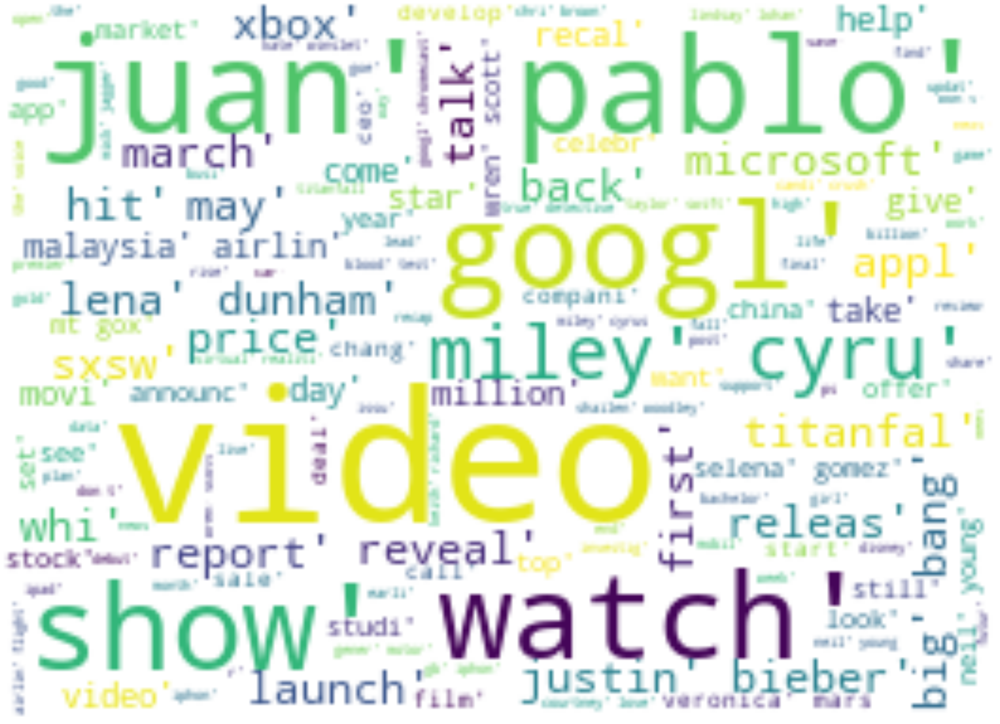

<Figure size 432x288 with 0 Axes>

In [ ]:
alice_mask = np.array(Image.open("/content/download.png"))

wc = WordCloud(background_color="white", max_words=2000, mask=alice_mask)

# generate word cloud
wc.generate(str(cleaned_data_title))

# store to file
wc.to_file("wordcloud_title.png")

# show
plt.figure( figsize=(180,80))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.figure()

### Categorize the Title column into positive, negative, and neutral headlines.<a id="chapter-7"></a>

In [ ]:
!pip install textblob

bloblist_desc = list()

df_review_str=df['TITLE'].astype(str)
for row in df_review_str:
    blob = TextBlob(row)
    bloblist_desc.append((row,blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_polarity_desc = pd.DataFrame(bloblist_desc, columns = ['TITLE','sentiment','polarity'])

def f(df_polarity_desc):
    if df_polarity_desc['sentiment'] > 0:
        val = "Positive Title"
    elif df_polarity_desc['sentiment'] == 0:
        val = "Neutral Title"
    else:
        val = "Negative Title"
    return val

In [ ]:
df_polarity_desc['Sentiment_Type'] = df_polarity_desc.apply(f, axis=1)
df_polarity_desc.head()

,TITLE,sentiment,polarity,Sentiment_Type
0,Fed's Charles Plosser sees high bar for change...,0.16,0.54,Positive Title
1,ECB FOCUS-Stronger euro drowns out ECB's messa...,0.00,0.30,Neutral Title
2,Forex Market: EUR/USD retreats from 2-1/2-year...,0.00,0.00,Neutral Title
3,ECB's Noyer: Low inflation may hamper adjustment,0.00,0.30,Neutral Title
4,ECB Unlocks Door for Further Euro Strength - W...,0.00,0.50,Neutral Title


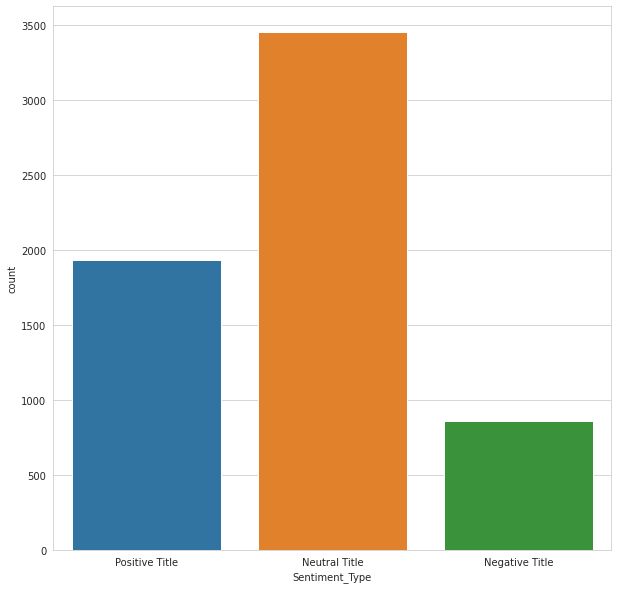

In [ ]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_polarity_desc)

The above barplot shows that there are more Neutral Title in the dataset. 

### Count the frequency of each word and display the words which are occuring most in Content column.<a id="chapter-8"></a>

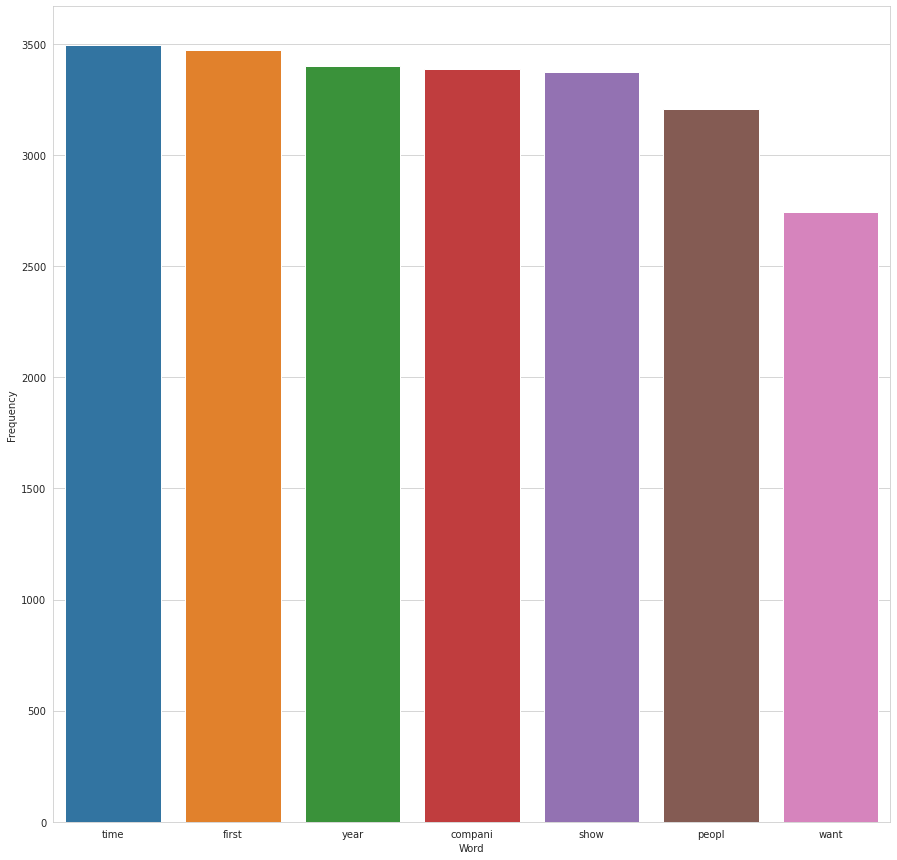

In [ ]:
a = title_stemming(lemmatization_content)
words_to_remove=['thi','also','it ','us ','one',' ','. ','said','say','new','like','get','make','last','use','said ']
filtered_sentence = []
for w in a:
    if w not in (stop_words):
        if w not in (words_to_remove):
            filtered_sentence.append(w)

# Remove characters which have length less than 2  
without_single_chr = [word for word in filtered_sentence if len(word) > 2]

# Remove numbers
cleaned_data_title = [word for word in without_single_chr if not word.isnumeric()]        

# Calculate frequency distribution
word_dist = nltk.FreqDist(cleaned_data_title)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(15,15))
sns.set_style("whitegrid")
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(7))

The above boxplot shows the most occuring words in the news content.

### The below code will show the wordcloud for the Content column.<a id="chapter-9"></a>

### Categorize the Content column into positive, negative, and neutral text. <a id="chapter-10"></a>

In [ ]:
bloblist_desc_content = list()

df_review_str_content=df['Content'].astype(str)
for row in df_review_str_content:
    blob_content = TextBlob(row)
    bloblist_desc_content.append((row,blob_content.sentiment.polarity, blob_content.sentiment.subjectivity))
    df_polarity_desc_content = pd.DataFrame(bloblist_desc_content, columns = ['Content','sentiment','polarity'])
 
def f(df_polarity_desc_content):
    if df_polarity_desc_content['sentiment'] > 0:
        val = "Positive Content"
    elif df_polarity_desc_content['sentiment'] == 0:
        val = "Neutral Content"
    else:
        val = "Negative Content"
    return val

df_polarity_desc_content['Sentiment_Type'] = df_polarity_desc_content.apply(f, axis=1)
df_polarity_desc_content.head()

,Content,sentiment,polarity,Sentiment_Type
0,Paris/London/Atlanta: Federal Reserve Bank of ...,0.082318,0.371394,Positive Content
1,"FRANKFURT, March 10 (Reuters) - The European C...",0.048656,0.353184,Positive Content
2,The euro retreated from highs unseen since Oct...,0.065611,0.382534,Positive Content
3,PARIS--The slow pace of price increases and no...,0.028859,0.460753,Positive Content
4,Fundamental Forecast for Euro: Neutral\n\n- Fo...,0.042328,0.451755,Positive Content


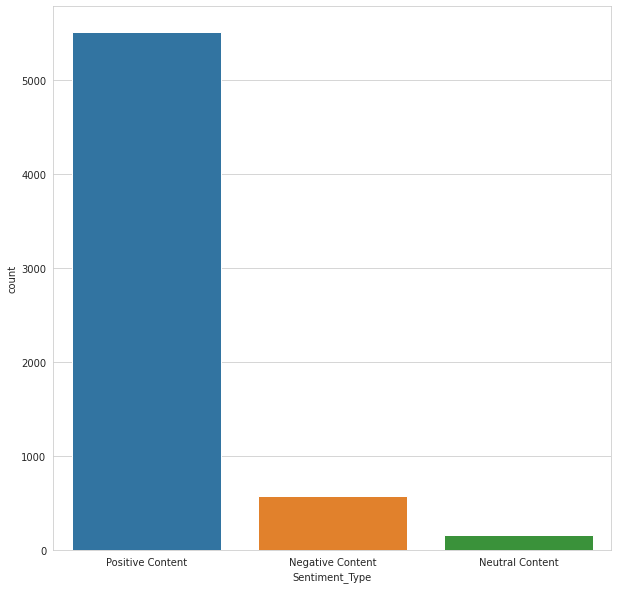

In [ ]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_polarity_desc_content)

The above barplot shows that there are more positive content in the dataset

### Vectorization<a id="chapter-11"></a>
> Need each news as some structure that can be fed to learning algorithm. We need to take the raw text and convert it into a vector. 
>> Process -
>> * Sentence Segmentation
>> * Tokenization
>> * Lemmatization
>> * Removing Stop Words
>> * Vectorization

In [ ]:
def text_process(title):
    nopunc=[word for word in title if word not in string.punctuation]
    nopunc=''.join(nopunc)
    return [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [ ]:
# Category column could be transformed to numerical column
category_dummies=pd.get_dummies(df['Category'])
df_polarity_desc=pd.concat((df_polarity_desc,category_dummies),axis=1)


title_class = df_polarity_desc[(df_polarity_desc['Sentiment_Type'] == 'Positive Title') | (df_polarity_desc['Sentiment_Type'] == 'Negative Title')]
X_title=title_class['TITLE']
title_class['Sentiment_Type'] = title_class.Sentiment_Type.map({'Positive Title':1, 'Negative Title':0})
y=title_class['Sentiment_Type']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
bow_transformer=CountVectorizer(analyzer=text_process).fit(X_title)

In [ ]:
print(len(bow_transformer.vocabulary_))

6693


In [ ]:
X_title = bow_transformer.transform(X_title)

### Training Data and Test Data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_title, y, test_size=0.2, random_state=101)

In [ ]:
# Creating Metrics Dataframe
metrics_df = pd.DataFrame(index = ['Metrics_Train','Metrics_Test'])
metrics_df_category= pd.DataFrame(index = ['Metrics_Train','Metrics_Test'])

# Function to print and add metrics to dataframe
def print_metrics(df, model, recall_train, recall_test):
    df[model] = [float("{0:.5f}".format(recall_train)), float("{0:.5f}".format(recall_test))]
    return df

def print_metrics_news_category(df, model, recall_train, recall_test):
    df[model] = [float("{0:.5f}".format(recall_train)), float("{0:.5f}".format(recall_test))]
    return df

### Prediction of News Title<a id="chapter-12"></a>

#### Naive Bayes Model

In [ ]:
nb = MultinomialNB()
nb.fit(X_train, y_train)

predict_train = nb.predict(X_train)
predict_test = nb.predict(X_test)

recall_train_nb=f1_score(y_train, predict_train)
recall_test_nb=f1_score(y_test, predict_test)

Once we predicted the values, now the most important task is to check and evaluate our model against the actual sentiment (stored in y_test) using confusion_matrix and classification_report from Scikit-learn.

#### Confusion Matrix

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,131,64,47,317


In [ ]:
# Printing the training and testing metrices

metrics_df = print_metrics(metrics_df, 'Naive Bayes_Model', recall_train_nb, recall_test_nb)
metrics_df

,Naive Bayes_Model
Metrics_Train,0.97316
Metrics_Test,0.85101


#### Multi Layer Perceptron

In [ ]:
# Import Multi-Layer Perceptron Classifier Model
mlp = MLPClassifier(hidden_layer_sizes=(37,37,37))
mlp.fit(X_train,y_train)

predict_train = mlp.predict(X_train)
predict_test = mlp.predict(X_test)

recall_train_mlp=f1_score(y_train, predict_train)
recall_test_mlp=f1_score(y_test, predict_test)

#### Confusion Matrix

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,127,68,39,325


In [ ]:
# Printing the training and testing metrices

metrics_df = print_metrics(metrics_df, 'MLP_Model', recall_train_mlp, recall_test_mlp)
metrics_df

,Naive Bayes_Model,MLP_Model
Metrics_Train,0.97316,1.00000
Metrics_Test,0.85101,0.85865


#### XGBoost

In [ ]:
xgb=XGBClassifier()

xgb_fit=xgb.fit(X_train, y_train)

predict_train = xgb.predict(X_train)
predict_test = xgb.predict(X_test)

recall_train_xgb = f1_score(y_train, predict_train)
recall_test_xgb = f1_score(y_test, predict_test)

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,57,138,8,356


In [ ]:
# Printing the training and testing metrices

metrics_df = print_metrics(metrics_df, 'XGB_Model', recall_train_xgb, recall_test_xgb)
metrics_df

,Naive Bayes_Model,MLP_Model,XGB_Model
Metrics_Train,0.97316,1.00000,0.86847
Metrics_Test,0.85101,0.85865,0.82984


From the above accuracy metrics, it is very clear that the Naive Bayes and MLP models are overfitted. Our best model for news sentiment prediction is XG Boost. Since, there is no much difference between training and testing data accuracy of XGB model. But in the other cases, the training accuracy is very high and testing is very low, therefore these models will not give best results on the unseen data. 

In [ ]:
pickle_models=pd.DataFrame(columns=['Model Name','Model'])
pickle_models=pickle_models.append({'Model Name':'Naive Bayes', 'Model': nb}, ignore_index=True)
pickle_models=pickle_models.append({'Model Name':'Multi Layer Perceptron', 'Model': mlp}, ignore_index=True)
pickle_models=pickle_models.append({'Model Name':'XG Boost', 'Model': xgb}, ignore_index=True)

### Validation of the model for Title column<a id="chapter-13"></a>

In [ ]:
title_positive=df['TITLE'][0]
title_positive

"Fed's Charles Plosser sees high bar for change in pace of tapering"

First, I want to test with the positive title. I have chosen the above title and its sentiment is Positive. After evaluating it should predict the sentiment as Positive.

In [ ]:
title_positive_transformed = bow_transformer.transform([title_positive])
nb.predict(title_positive_transformed)[0]

1

Second, I want to test with the negative title. I have chosen the below title and its sentiment is negative. After evaluating it should predict the sentiment as Negative.

In [ ]:
title_negative=df['TITLE'][14]
title_negative

"$5 20-piece chicken nuggets didn't help McDonald's reverse US sales decline"

In [ ]:
title_negative_transformed = bow_transformer.transform([title_negative])
nb.predict(title_negative_transformed)[0]

0

### Prediction of News Category<a id="chapter-14"></a>

We are predicting whether news is in Business category or Entertainment category

In [ ]:
df_news_business_entertainment=df_polarity_desc[(df_polarity_desc['Business']==1) | (df_polarity_desc['Entertainment']==1)]

In [ ]:
df_news_business_entertainment.head()

,TITLE,sentiment,polarity,Sentiment_Type,Business,Entertainment,Health,Science And Technology
0,Fed's Charles Plosser sees high bar for change...,0.16,0.54,Positive Title,1,0,0,0
1,ECB FOCUS-Stronger euro drowns out ECB's messa...,0.00,0.30,Neutral Title,1,0,0,0
2,Forex Market: EUR/USD retreats from 2-1/2-year...,0.00,0.00,Neutral Title,1,0,0,0
3,ECB's Noyer: Low inflation may hamper adjustment,0.00,0.30,Neutral Title,1,0,0,0
4,ECB Unlocks Door for Further Euro Strength - W...,0.00,0.50,Neutral Title,1,0,0,0


In [ ]:
X_category=df_news_business_entertainment['TITLE']
y=df_news_business_entertainment['Business']

In [ ]:
bow_transformer_category=CountVectorizer(analyzer=text_process).fit(X_category)

In [ ]:
print(len(bow_transformer_category.vocabulary_))

8024


In [ ]:
X_category = bow_transformer_category.transform(X_category)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_category, y, test_size=0.1, random_state=101)

#### Naive Bayes Model

In [ ]:
nb.fit(X_train, y_train)

predict_train = nb.predict(X_train)
predict_test = nb.predict(X_test)

recall_train_nb=f1_score(y_train, predict_train)
recall_test_nb=f1_score(y_test, predict_test)

#### Confusion Matrix

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,183,25,29,160


In [ ]:
# Printing the training and testing metrices

metrics_df_category = print_metrics_news_category(metrics_df_category, 'Naive Bayes_Model', recall_train_mlp, recall_test_mlp)
metrics_df_category

,Naive Bayes_Model
Metrics_Train,1.00000
Metrics_Test,0.85865


#### XG Boost

In [ ]:
xgb_fit=xgb.fit(X_train, y_train)

predict_train = xgb.predict(X_train)
predict_test = xgb.predict(X_test)

recall_train_xgb = f1_score(y_train, predict_train)
recall_test_xgb = f1_score(y_test, predict_test)

#### Confusion Matrix

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,201,7,107,82


In [ ]:
# Printing the training and testing metrices

metrics_df_category = print_metrics_news_category(metrics_df_category, 'XGB_Model', recall_train_xgb, recall_test_xgb)
metrics_df_category

,Naive Bayes_Model,XGB_Model
Metrics_Train,1.00000,0.65365
Metrics_Test,0.85865,0.58993


#### Multi Layer Perceptron

In [ ]:
mlp.fit(X_train,y_train)

predict_train = mlp.predict(X_train)
predict_test = mlp.predict(X_test)

recall_train_mlp=f1_score(y_train, predict_train)
recall_test_mlp=f1_score(y_test, predict_test)

#### Confusion Matrix

In [ ]:
cm = confusion_matrix(y_test, predict_test).ravel()
cm = pd.DataFrame(cm.reshape((1,4)), columns=['TN', 'FP', 'FN', 'TP'])
display(cm)

,TN,FP,FN,TP
0,187,21,30,159


In [ ]:
# Printing the training and testing metrices

metrics_df_category = print_metrics_news_category(metrics_df_category, 'MLP_Model', recall_train_mlp, recall_test_mlp)
metrics_df_category

,Naive Bayes_Model,XGB_Model,MLP_Model
Metrics_Train,1.00000,0.65365,0.99848
Metrics_Test,0.85865,0.58993,0.86179


From the above accuracy metrics, it is very clear that the Naive Bayes and MLP models are overfitted. Our best model for news category prediction is XG Boost. Since, there is no much difference between training and testing data accuracy of XGB model. But in the other cases, the training accuracy is very high and testing is very low, therefore these models will not give best results on the unseen data.

### Validation of the model News Category<a id="chapter-15"></a>

The below News Title comes under Business News Category. If the output gives 1 then it is predicted successfully.

In [ ]:
Category_business=df_news_business_entertainment['TITLE'][0]
Category_business

"Fed's Charles Plosser sees high bar for change in pace of tapering"

In [ ]:
Category_business_transformed = bow_transformer_category.transform([Category_business])
nb.predict(Category_business_transformed)[0]

1

The below News Title comes under Entertainment News Category. If the output gives 0 then it is predicted successfully.

In [ ]:
category_entertainment=df_news_business_entertainment['TITLE'][6242]
category_entertainment

"REPORT: Older women far more likely to get Alzheimer's than breast cancer"

In [ ]:
category_entertainment_transformed = bow_transformer_category.transform([category_entertainment])
nb.predict(category_entertainment_transformed)[0]

0

Our model successfully predicted the news title and category. For this dataset, our best model is XG Boost. The other model has high accuracy in training data but they are overfitting the models.